In [296]:
import requests
import numpy as np
import time
import os
import matplotlib.pyplot as plt
from bs4 import BeautifulSoup as BS
import pandas as pd
from urllib.request import urlopen, Request
from nltk.sentiment.vader import SentimentIntensityAnalyzer
app_id= "e7cbde9e-8241-4e59-a78a-9c866ff45eb9"
my_key= "meZeRjFlLqRyFEAGOEIKcW0mkiWRIXdJ"

In [8]:
def call_nyt_by_year_and_page(year, page):
    root_url   = 'https://api.nytimes.com/svc/search/v2/articlesearch.json?q=tesla&sort=newest'
    begin_date = '&begin_date={}0101'.format(str(year))
    end_date   = '&end_date={}1231'.format(str(year))
    pagination = '&page={}'.format(str(page))
    doc_params = '&fl=web_url&fl=snippet&fl=pub_date&fl=_id&fl=lead_paragraph'
    
    url        = root_url + begin_date + end_date + pagination + doc_params + '&api-key=' + my_key
    print(url)
    
    response   = requests.get(url)
    
    return response.json()

In [9]:
def call_nyt_by_year(year):
    annual_articles = []
    
    # find how many articles (hits) contain 'tesla' in a calendar year
    total_results = call_nyt_by_year_and_page(year,0)
    hits  = total_results['response']['meta']['hits']
    
    # request all available pages
    # sleep 7 seconds to clear NYT API rate limit
    for i in range(int(hits/10)):
        query = call_nyt_by_year_and_page(year,i)
        annual_articles = annual_articles + query['response']['docs']
        time.sleep(7)
        
    return annual_articles

In [10]:
def call_nyt_by_all_years(years):
    all_articles = []
    
    for year in years:
        annual_articles = call_nyt_by_year(year)
        all_articles = all_articles + annual_articles
        time.sleep(7)
        
    return all_articles

In [11]:
all_years    = list(range(2013,2021))
all_articles = call_nyt_by_all_years(all_years)

https://api.nytimes.com/svc/search/v2/articlesearch.json?q=tesla&sort=newest&begin_date=20130101&end_date=20131231&page=0&fl=web_url&fl=snippet&fl=pub_date&fl=_id&fl=lead_paragraph&api-key=meZeRjFlLqRyFEAGOEIKcW0mkiWRIXdJ
https://api.nytimes.com/svc/search/v2/articlesearch.json?q=tesla&sort=newest&begin_date=20130101&end_date=20131231&page=0&fl=web_url&fl=snippet&fl=pub_date&fl=_id&fl=lead_paragraph&api-key=meZeRjFlLqRyFEAGOEIKcW0mkiWRIXdJ
https://api.nytimes.com/svc/search/v2/articlesearch.json?q=tesla&sort=newest&begin_date=20130101&end_date=20131231&page=1&fl=web_url&fl=snippet&fl=pub_date&fl=_id&fl=lead_paragraph&api-key=meZeRjFlLqRyFEAGOEIKcW0mkiWRIXdJ
https://api.nytimes.com/svc/search/v2/articlesearch.json?q=tesla&sort=newest&begin_date=20130101&end_date=20131231&page=2&fl=web_url&fl=snippet&fl=pub_date&fl=_id&fl=lead_paragraph&api-key=meZeRjFlLqRyFEAGOEIKcW0mkiWRIXdJ
https://api.nytimes.com/svc/search/v2/articlesearch.json?q=tesla&sort=newest&begin_date=20130101&end_date=201312

https://api.nytimes.com/svc/search/v2/articlesearch.json?q=tesla&sort=newest&begin_date=20140101&end_date=20141231&page=15&fl=web_url&fl=snippet&fl=pub_date&fl=_id&fl=lead_paragraph&api-key=meZeRjFlLqRyFEAGOEIKcW0mkiWRIXdJ
https://api.nytimes.com/svc/search/v2/articlesearch.json?q=tesla&sort=newest&begin_date=20140101&end_date=20141231&page=16&fl=web_url&fl=snippet&fl=pub_date&fl=_id&fl=lead_paragraph&api-key=meZeRjFlLqRyFEAGOEIKcW0mkiWRIXdJ
https://api.nytimes.com/svc/search/v2/articlesearch.json?q=tesla&sort=newest&begin_date=20140101&end_date=20141231&page=17&fl=web_url&fl=snippet&fl=pub_date&fl=_id&fl=lead_paragraph&api-key=meZeRjFlLqRyFEAGOEIKcW0mkiWRIXdJ
https://api.nytimes.com/svc/search/v2/articlesearch.json?q=tesla&sort=newest&begin_date=20140101&end_date=20141231&page=18&fl=web_url&fl=snippet&fl=pub_date&fl=_id&fl=lead_paragraph&api-key=meZeRjFlLqRyFEAGOEIKcW0mkiWRIXdJ
https://api.nytimes.com/svc/search/v2/articlesearch.json?q=tesla&sort=newest&begin_date=20140101&end_date=20

https://api.nytimes.com/svc/search/v2/articlesearch.json?q=tesla&sort=newest&begin_date=20160101&end_date=20161231&page=4&fl=web_url&fl=snippet&fl=pub_date&fl=_id&fl=lead_paragraph&api-key=meZeRjFlLqRyFEAGOEIKcW0mkiWRIXdJ
https://api.nytimes.com/svc/search/v2/articlesearch.json?q=tesla&sort=newest&begin_date=20160101&end_date=20161231&page=5&fl=web_url&fl=snippet&fl=pub_date&fl=_id&fl=lead_paragraph&api-key=meZeRjFlLqRyFEAGOEIKcW0mkiWRIXdJ
https://api.nytimes.com/svc/search/v2/articlesearch.json?q=tesla&sort=newest&begin_date=20160101&end_date=20161231&page=6&fl=web_url&fl=snippet&fl=pub_date&fl=_id&fl=lead_paragraph&api-key=meZeRjFlLqRyFEAGOEIKcW0mkiWRIXdJ
https://api.nytimes.com/svc/search/v2/articlesearch.json?q=tesla&sort=newest&begin_date=20160101&end_date=20161231&page=7&fl=web_url&fl=snippet&fl=pub_date&fl=_id&fl=lead_paragraph&api-key=meZeRjFlLqRyFEAGOEIKcW0mkiWRIXdJ
https://api.nytimes.com/svc/search/v2/articlesearch.json?q=tesla&sort=newest&begin_date=20160101&end_date=201612

JSONDecodeError: Expecting value: line 1 column 1 (char 0)

In [29]:
with open("nyt_api_2010_2019.json", "r") as read_file:
    data = json.load(read_file)

In [30]:
data

[{'web_url': 'https://www.nytimes.com/2011/01/02/automobiles/02WRAP2010.html',
  'snippet': 'For the automotive industry, 2010 played out like a reality show, with heroes and villains, surprising alliances, narrow escapes and thrilling reversals of fortune.',
  'lead_paragraph': 'THE last year in automobiles could have been mistaken for an episode of “Survivor,” only set in the urban jungle of Detroit rather than some tropical backwater. ',
  'pub_date': '2010-12-31T13:58:12+0000',
  '_id': '5c9eafb249f0eacbf11661b4'},
 {'web_url': 'https://www.nytimes.com/2010/12/31/us/31ttgone.html',
  'snippet': 'Picks for the most interesting things to do around the state this week.',
  'lead_paragraph': 'Our quirky, discerning picks for',
  'pub_date': '2010-12-31T03:21:39+0000',
  '_id': '5c9eafaf49f0eacbf1166134'},
 {'web_url': 'https://dealbook.nytimes.com/2010/12/30/is-2011-the-year-of-the-blockbuster-tech-i-p-o/',
  'snippet': 'Silicon Valley could see a modest return to the prerecession days

In [31]:
def get_nyt_text(url):
    headers = {'user-agent': 'Mozilla/5.0 (Macintosh; Intel Mac OS X 10_11_6) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/53.0.2785.143 Safari/537.36'}
    page = requests.get(url, headers=headers)
    page.status_code
    
    soup = BS(page.content, 'html.parser')
    content = soup.find_all('p')
    
    nyt = ''
    for index in range(len(content)):
        nyt += content[index].get_text(strip= True)
        
    return nyt

In [35]:
for i in range(len(data)):
    print(i)
#     print(data[i]['web_url'])
    data[i]['article'] = get_nyt_text(data[i]['web_url'])

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1861
1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060


In [36]:
data

[{'web_url': 'https://www.nytimes.com/2011/01/02/automobiles/02WRAP2010.html',
  'snippet': 'For the automotive industry, 2010 played out like a reality show, with heroes and villains, surprising alliances, narrow escapes and thrilling reversals of fortune.',
  'lead_paragraph': 'THE last year in automobiles could have been mistaken for an episode of “Survivor,” only set in the urban jungle of Detroit rather than some tropical backwater. ',
  'pub_date': '2010-12-31T13:58:12+0000',
  '_id': '5c9eafb249f0eacbf11661b4',
  'article': 'AdvertisementSupported byByLawrence UlrichTHE last year in automobiles could have been mistaken for an episode of “Survivor,” only set in the urban jungle of Detroit rather than some tropical backwater.As industry players retrenched and gritted their teeth for challenges to come, the 2010 season featured heroes and villains, new alliances, narrow escapes and thrilling reversals of fortune.For some played-out brands, there was no room on the shrinking island.

In [37]:
import re
def dict_cleaning(data):
    for dic in data:
        for num in range(len(data)):
            s=dic['article'].encode("ascii", "ignore").decode("utf-8")
            s=re.sub("\n","", s)
            s=re.sub("\s{4,}"," ",s)
            s=re.sub("(^|Advert)[A-Za-z]*\s(\w+)\s(\w+)","",s)
            # s=re.sub("AdvertisementSupported byBy","",s)
            s=re.sub(".Advertisement","",s)
            dic['article']=s
  

In [38]:
dict_cleaning(data)

In [41]:
with open("nyt_tesla_scrapped_2019_on", "r") as read_file:
    data_2019 = json.load(read_file)

In [43]:
dict_cleaning(data_2019)

In [44]:
data_2019

[{'web_url': 'https://www.nytimes.com/2019/12/31/business/electric-cars-germany-economy.html',
  'snippet': 'Automakers and suppliers are cutting costs so they can invest in new technology. Workers are feeling the impact.',
  'lead_paragraph': 'ÖHRINGEN, Germany — Öhringen lies deep in automaking country, homeland of Germany’s biggest industry and a source of national pride. And by most appearances, life is pretty good. ',
  'pub_date': '2019-12-31T10:00:25+0000',
  '_id': 'nyt://article/2b146b82-22a2-5576-a7db-e1adb7a86efc',
  'article': '. Workers are feeling the impact.Ziehl-Abeggs product for electric mobility, the ZAwheel.Credit...Felix Schmitt for The New York TimesSupported byByJack EwingHRINGEN, Germany  hringen lies deep in automaking country, homeland of Germanys biggest industry and a source of national pride. And by most appearances, life is pretty good.The unemployment rate in hringen is a mere 2.3 percent. Restaurants, nursing homes and kindergartens are begging for worke

In [48]:
word='Tesla'
count=0
for i in range(len(data_2019)):
    if word in data[i]['article']:
        count +=1

count 

630

In [46]:
len(data_2019)

680

In [51]:
#clearly not all articles mentions the word tesla in them so lets gather a full lsit of articles from both scrapped sets
word="Tesla"
articles=[]
for i in range(len(data)):
    if word in data[i]['article']:
        articles.append(data[i])
#now for the 2019 dataset        
for i in range(len(data_2019)):
    if word in data_2019[i]['article']:
        articles.append(data[i])
        
len(articles)

3096

In [53]:
#save the article file so we do not have run into any issues
with open("selected_articles", "w") as write_file:
    json.dump(articles, write_file)

In [54]:
# ok so now we have over 3000s articles spanning from 2010-2021

#Due to some issues I ran into we first have to perform sentiment 
#analysis we first will run VADER sentiment on both files and then combine them

import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer as SI
nltk.download('vader_lexicon')

SI= SentimentIntensityAnalyzer()

for i in data:
    i.update({'sentiment':SI.polarity_scores(i['article'])})
for i in data_2019:
    i.update({'sentiment':SI.polarity_scores(i['article'])})



[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/tbai/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [59]:
article_sentiment=pd.DataFrame(data)
article_sentiment_2019_on = pd.DataFrame(data_2019)

In [114]:
combined_articles= pd.concat([article_sentiment, article_sentiment_2019_on],axis=0)

In [115]:
len(article_sentiment)

2540

In [116]:
len(article_sentiment_2019_on)

680

In [117]:
combined_articles

,web_url,snippet,lead_paragraph,pub_date,_id,article,sentiment
0,https://www.nytimes.com/2011/01/02/automobiles...,"For the automotive industry, 2010 played out l...",THE last year in automobiles could have been m...,2010-12-31T13:58:12+0000,5c9eafb249f0eacbf11661b4,"Survivor, only set in the urban jungle of Det...","{'neg': 0.037, 'neu': 0.861, 'pos': 0.102, 'co..."
1,https://www.nytimes.com/2010/12/31/us/31ttgone...,Picks for the most interesting things to do ar...,"Our quirky, discerning picks for",2010-12-31T03:21:39+0000,5c9eafaf49f0eacbf1166134,"quirky, discerning picks forthe most interest...","{'neg': 0.04, 'neu': 0.84, 'pos': 0.12, 'compo..."
2,https://dealbook.nytimes.com/2010/12/30/is-201...,Silicon Valley could see a modest return to th...,"FarmVille, Zynga’s online game.",2010-12-30T14:31:16+0000,5ca0acaf49f0eacbf1f520a7,"-ups, the initial public offering has long los...","{'neg': 0.043, 'neu': 0.845, 'pos': 0.112, 'co..."
3,https://wheels.blogs.nytimes.com/2010/12/28/te...,With investors free to sell their stock from t...,From our colleagues at DealBook:,2010-12-28T15:35:48+0000,5ca0a55149f0eacbf1f28e83,atDealBook:It wasnt a very merry Christmas fo...,"{'neg': 0.02, 'neu': 0.884, 'pos': 0.096, 'com..."
4,https://dealbook.nytimes.com/2010/12/27/tesla-...,With investors free to sell their stock from t...,It wasn’t a very merry Christmas for Tesla.,2010-12-27T20:16:26+0000,5ca0b06b49f0eacbf1f651cd,"Tesla.Fresh from the holiday, shares of Tesla...","{'neg': 0.049, 'neu': 0.887, 'pos': 0.064, 'co..."
...,...,...,...,...,...,...,...
675,https://www.nytimes.com/2020/01/14/business/av...,"Aventura Mall, near Miami, isn’t shy about inv...",Some retailers have turned to extras like virt...,2020-01-14T14:00:16+0000,nyt://article/28b91387-bc75-55c5-93e4-191325ed...,"Mall, near Miami, isnt shy about investing in...","{'neg': 0.027, 'neu': 0.907, 'pos': 0.066, 'co..."
676,https://www.nytimes.com/2020/01/12/business/th...,,Let’s start with the good news: The December j...,2020-01-12T12:00:07+0000,nyt://article/d56f4eb1-733a-5a28-b592-339fe4eb...,: The December jobs report showed thatunemploy...,"{'neg': 0.085, 'neu': 0.838, 'pos': 0.076, 'co..."
677,https://www.nytimes.com/2020/01/11/style/colle...,"Facebook, Google and other major tech firms we...","In 2006, Google bought YouTube for more than $...",2020-01-11T10:00:11+0000,nyt://article/bf207e77-c254-510e-aa4e-c1c42527...,"Facebook, Google and other major tech firms we...","{'neg': 0.068, 'neu': 0.817, 'pos': 0.116, 'co..."
678,https://www.nytimes.com/2020/01/10/business/de...,Boeing released more than 100 pages of interna...,Good Friday. The Labor Department’s job report...,2020-01-10T11:14:42+0000,nyt://article/458116b4-9c0a-58e3-8ee5-f9967d5e...,. The Labor Departments job report for Decembe...,"{'neg': 0.064, 'neu': 0.838, 'pos': 0.098, 'co..."


In [118]:
#dropping duplicates
combined_articles.drop_duplicates(subset='web_url', inplace= True)

In [119]:
combined_articles.reset_index()

,index,web_url,snippet,lead_paragraph,pub_date,_id,article,sentiment
0,0,https://www.nytimes.com/2011/01/02/automobiles...,"For the automotive industry, 2010 played out l...",THE last year in automobiles could have been m...,2010-12-31T13:58:12+0000,5c9eafb249f0eacbf11661b4,"Survivor, only set in the urban jungle of Det...","{'neg': 0.037, 'neu': 0.861, 'pos': 0.102, 'co..."
1,1,https://www.nytimes.com/2010/12/31/us/31ttgone...,Picks for the most interesting things to do ar...,"Our quirky, discerning picks for",2010-12-31T03:21:39+0000,5c9eafaf49f0eacbf1166134,"quirky, discerning picks forthe most interest...","{'neg': 0.04, 'neu': 0.84, 'pos': 0.12, 'compo..."
2,2,https://dealbook.nytimes.com/2010/12/30/is-201...,Silicon Valley could see a modest return to th...,"FarmVille, Zynga’s online game.",2010-12-30T14:31:16+0000,5ca0acaf49f0eacbf1f520a7,"-ups, the initial public offering has long los...","{'neg': 0.043, 'neu': 0.845, 'pos': 0.112, 'co..."
3,3,https://wheels.blogs.nytimes.com/2010/12/28/te...,With investors free to sell their stock from t...,From our colleagues at DealBook:,2010-12-28T15:35:48+0000,5ca0a55149f0eacbf1f28e83,atDealBook:It wasnt a very merry Christmas fo...,"{'neg': 0.02, 'neu': 0.884, 'pos': 0.096, 'com..."
4,4,https://dealbook.nytimes.com/2010/12/27/tesla-...,With investors free to sell their stock from t...,It wasn’t a very merry Christmas for Tesla.,2010-12-27T20:16:26+0000,5ca0b06b49f0eacbf1f651cd,"Tesla.Fresh from the holiday, shares of Tesla...","{'neg': 0.049, 'neu': 0.887, 'pos': 0.064, 'co..."
...,...,...,...,...,...,...,...,...
3039,675,https://www.nytimes.com/2020/01/14/business/av...,"Aventura Mall, near Miami, isn’t shy about inv...",Some retailers have turned to extras like virt...,2020-01-14T14:00:16+0000,nyt://article/28b91387-bc75-55c5-93e4-191325ed...,"Mall, near Miami, isnt shy about investing in...","{'neg': 0.027, 'neu': 0.907, 'pos': 0.066, 'co..."
3040,676,https://www.nytimes.com/2020/01/12/business/th...,,Let’s start with the good news: The December j...,2020-01-12T12:00:07+0000,nyt://article/d56f4eb1-733a-5a28-b592-339fe4eb...,: The December jobs report showed thatunemploy...,"{'neg': 0.085, 'neu': 0.838, 'pos': 0.076, 'co..."
3041,677,https://www.nytimes.com/2020/01/11/style/colle...,"Facebook, Google and other major tech firms we...","In 2006, Google bought YouTube for more than $...",2020-01-11T10:00:11+0000,nyt://article/bf207e77-c254-510e-aa4e-c1c42527...,"Facebook, Google and other major tech firms we...","{'neg': 0.068, 'neu': 0.817, 'pos': 0.116, 'co..."
3042,678,https://www.nytimes.com/2020/01/10/business/de...,Boeing released more than 100 pages of interna...,Good Friday. The Labor Department’s job report...,2020-01-10T11:14:42+0000,nyt://article/458116b4-9c0a-58e3-8ee5-f9967d5e...,. The Labor Departments job report for Decembe...,"{'neg': 0.064, 'neu': 0.838, 'pos': 0.098, 'co..."


In [120]:
#lets use articles from 2013 as tesla was still in its early stages and the stock was not very volatile

#clean the date column of the dataframe:
combined_articles['date']= pd.to_datetime(combined_articles.pub_date).dt.date

In [121]:
combined_articles

,web_url,snippet,lead_paragraph,pub_date,_id,article,sentiment,date
0,https://www.nytimes.com/2011/01/02/automobiles...,"For the automotive industry, 2010 played out l...",THE last year in automobiles could have been m...,2010-12-31T13:58:12+0000,5c9eafb249f0eacbf11661b4,"Survivor, only set in the urban jungle of Det...","{'neg': 0.037, 'neu': 0.861, 'pos': 0.102, 'co...",2010-12-31
1,https://www.nytimes.com/2010/12/31/us/31ttgone...,Picks for the most interesting things to do ar...,"Our quirky, discerning picks for",2010-12-31T03:21:39+0000,5c9eafaf49f0eacbf1166134,"quirky, discerning picks forthe most interest...","{'neg': 0.04, 'neu': 0.84, 'pos': 0.12, 'compo...",2010-12-31
2,https://dealbook.nytimes.com/2010/12/30/is-201...,Silicon Valley could see a modest return to th...,"FarmVille, Zynga’s online game.",2010-12-30T14:31:16+0000,5ca0acaf49f0eacbf1f520a7,"-ups, the initial public offering has long los...","{'neg': 0.043, 'neu': 0.845, 'pos': 0.112, 'co...",2010-12-30
3,https://wheels.blogs.nytimes.com/2010/12/28/te...,With investors free to sell their stock from t...,From our colleagues at DealBook:,2010-12-28T15:35:48+0000,5ca0a55149f0eacbf1f28e83,atDealBook:It wasnt a very merry Christmas fo...,"{'neg': 0.02, 'neu': 0.884, 'pos': 0.096, 'com...",2010-12-28
4,https://dealbook.nytimes.com/2010/12/27/tesla-...,With investors free to sell their stock from t...,It wasn’t a very merry Christmas for Tesla.,2010-12-27T20:16:26+0000,5ca0b06b49f0eacbf1f651cd,"Tesla.Fresh from the holiday, shares of Tesla...","{'neg': 0.049, 'neu': 0.887, 'pos': 0.064, 'co...",2010-12-27
...,...,...,...,...,...,...,...,...
675,https://www.nytimes.com/2020/01/14/business/av...,"Aventura Mall, near Miami, isn’t shy about inv...",Some retailers have turned to extras like virt...,2020-01-14T14:00:16+0000,nyt://article/28b91387-bc75-55c5-93e4-191325ed...,"Mall, near Miami, isnt shy about investing in...","{'neg': 0.027, 'neu': 0.907, 'pos': 0.066, 'co...",2020-01-14
676,https://www.nytimes.com/2020/01/12/business/th...,,Let’s start with the good news: The December j...,2020-01-12T12:00:07+0000,nyt://article/d56f4eb1-733a-5a28-b592-339fe4eb...,: The December jobs report showed thatunemploy...,"{'neg': 0.085, 'neu': 0.838, 'pos': 0.076, 'co...",2020-01-12
677,https://www.nytimes.com/2020/01/11/style/colle...,"Facebook, Google and other major tech firms we...","In 2006, Google bought YouTube for more than $...",2020-01-11T10:00:11+0000,nyt://article/bf207e77-c254-510e-aa4e-c1c42527...,"Facebook, Google and other major tech firms we...","{'neg': 0.068, 'neu': 0.817, 'pos': 0.116, 'co...",2020-01-11
678,https://www.nytimes.com/2020/01/10/business/de...,Boeing released more than 100 pages of interna...,Good Friday. The Labor Department’s job report...,2020-01-10T11:14:42+0000,nyt://article/458116b4-9c0a-58e3-8ee5-f9967d5e...,. The Labor Departments job report for Decembe...,"{'neg': 0.064, 'neu': 0.838, 'pos': 0.098, 'co...",2020-01-10


In [122]:
cleaned_sentiment= combined_articles.drop(combined_articles.columns[:6],1)

In [135]:
cleaned_sentiment=cleaned_sentiment.reset_index()
cleaned_sentiment

,level_0,index,sentiment,date
0,0,0,"{'neg': 0.037, 'neu': 0.861, 'pos': 0.102, 'co...",2010-12-31
1,1,1,"{'neg': 0.04, 'neu': 0.84, 'pos': 0.12, 'compo...",2010-12-31
2,2,2,"{'neg': 0.043, 'neu': 0.845, 'pos': 0.112, 'co...",2010-12-30
3,3,3,"{'neg': 0.02, 'neu': 0.884, 'pos': 0.096, 'com...",2010-12-28
4,4,4,"{'neg': 0.049, 'neu': 0.887, 'pos': 0.064, 'co...",2010-12-27
...,...,...,...,...
3039,3039,675,"{'neg': 0.027, 'neu': 0.907, 'pos': 0.066, 'co...",2020-01-14
3040,3040,676,"{'neg': 0.085, 'neu': 0.838, 'pos': 0.076, 'co...",2020-01-12
3041,3041,677,"{'neg': 0.068, 'neu': 0.817, 'pos': 0.116, 'co...",2020-01-11
3042,3042,678,"{'neg': 0.064, 'neu': 0.838, 'pos': 0.098, 'co...",2020-01-10


In [144]:

type(df2)

pandas.core.frame.DataFrame

In [146]:
#seperate the dictionary items into seperate columns

df2 = pd.json_normalize(cleaned_sentiment['sentiment'])
df2 = pd.DataFrame(df2)

cleaned_sentiment_Vader= pd.concat([df2, cleaned_sentiment],1)
cleaned_sentiment_Vader

cleaned_sentiment_Vader.drop(['sentiment','level_0','index'],1,inplace=True)
cleaned_sentiment_Vader.set_index(['date'])

,neg,neu,pos,compound
date,,,,
2010-12-31,0.037,0.861,0.102,0.9984
2010-12-31,0.040,0.840,0.120,0.9967
2010-12-30,0.043,0.845,0.112,0.9944
2010-12-28,0.020,0.884,0.096,0.9576
2010-12-27,0.049,0.887,0.064,0.7255
...,...,...,...,...
2020-01-14,0.027,0.907,0.066,0.9941
2020-01-12,0.085,0.838,0.076,-0.8980
2020-01-11,0.068,0.817,0.116,0.9992


In [147]:
#so there are multiple articles on the same day
#will need to do something about that
cleaned_sentiment_Vader.groupby('date')['neg'].count()

date
2010-01-02    1
2010-01-05    1
2010-01-07    1
2010-01-11    1
2010-01-12    4
             ..
2020-12-26    1
2020-12-28    2
2020-12-29    1
2020-12-30    2
2020-12-31    2
Name: neg, Length: 1763, dtype: int64

In [153]:
#lets aggregative the days with 
sentiment_counts= cleaned_sentiment_Vader.groupby('date').mean()


#lets add article count into the dataframe
#count out articles of each date
c= cleaned_sentiment_Vader.groupby('date')['neg'].count().to_frame()

df_vader_final= sentiment_counts.merge(c, how='inner', left_on= "date", right_on='date')

df_vader_final.rename(columns={'neg_y':'article_count'}, inplace=True)
df_vader_final

,neg_x,neu,pos,compound,article_count
date,,,,,
2010-01-02,0.07500,0.8130,0.1120,0.997600,1
2010-01-05,0.03900,0.8880,0.0730,0.929400,1
2010-01-07,0.04900,0.8870,0.0640,0.864100,1
2010-01-11,0.03100,0.9000,0.0690,0.968200,1
2010-01-12,0.02225,0.8925,0.0855,0.979775,4
...,...,...,...,...,...
2020-12-26,0.05300,0.8170,0.1300,0.999300,1
2020-12-28,0.03950,0.8800,0.0800,0.993400,2
2020-12-29,0.04700,0.9190,0.0340,-0.780400,1


## Let's also apply Text Blob as well

In [191]:
from textblob import TextBlob


#lets get the polarity scores for each part of the article
for art in data:
    #lets get the sentiment scores 
    art['TextBlob_article_polarity']= TextBlob(art['article']).sentiment[0]
    art['TextBlob_article_subjectivity']= TextBlob(art['article']).sentiment[1]
    
    #lets go ahead and get the sentiment for the lead paragraph as well as for the snippet
    art['TextBlob_snippet_polarity']= TextBlob(art['snippet']).sentiment[0]
    art['TextBlob_snippet_subjectivity']= TextBlob(art['snippet']).sentiment[1]
    
    #as well as the lead paragraph
    art['TextBlob_lead_polarity']= TextBlob(art['lead_paragraph']).sentiment[0]
    art['TextBlob_lead_subjectivity']= TextBlob(art['lead_paragraph']).sentiment[1]
    
for art in data_2019:
    #lets get the sentiment scores 
    art['TextBlob_article_polarity']= TextBlob(art['article']).sentiment[0]
    art['TextBlob_article_subjectivity']= TextBlob(art['article']).sentiment[1]
    
    #lets go ahead and get the sentiment for the lead paragraph as well as for the snippet
    art['TextBlob_snippet_polarity']= TextBlob(art['snippet']).sentiment[0]
    art['TextBlob_snippet_subjectivity']= TextBlob(art['snippet']).sentiment[1]
    
    #as well as the lead paragraph
    art['TextBlob_lead_polarity']= TextBlob(art['lead_paragraph']).sentiment[0]
    art['TextBlob_lead_subjectivity']= TextBlob(art['lead_paragraph']).sentiment[1]
        

In [192]:
article_sentiment_TB=pd.DataFrame(data)
article_sentiment_2019_on_TB = pd.DataFrame(data_2019)

In [193]:
article_sentiment_TB

,web_url,snippet,lead_paragraph,pub_date,_id,article,sentiment,TextBlob_article_polarity,TextBlob_article_subjectivity,TextBlob_snippet_polarity,TextBlob_snippet_subjectivity,TextBlob_lead_polarity,TextBlob_lead_subjectivity
0,https://www.nytimes.com/2011/01/02/automobiles...,"For the automotive industry, 2010 played out l...",THE last year in automobiles could have been m...,2010-12-31T13:58:12+0000,5c9eafb249f0eacbf11661b4,"Survivor, only set in the urban jungle of Det...","{'neg': 0.037, 'neu': 0.861, 'pos': 0.102, 'co...",0.107837,0.429510,0.250000,0.633333,0.0,0.355556
1,https://www.nytimes.com/2010/12/31/us/31ttgone...,Picks for the most interesting things to do ar...,"Our quirky, discerning picks for",2010-12-31T03:21:39+0000,5c9eafaf49f0eacbf1166134,"quirky, discerning picks forthe most interest...","{'neg': 0.04, 'neu': 0.84, 'pos': 0.12, 'compo...",0.178220,0.394851,0.500000,0.500000,0.0,1.000000
2,https://dealbook.nytimes.com/2010/12/30/is-201...,Silicon Valley could see a modest return to th...,"FarmVille, Zynga’s online game.",2010-12-30T14:31:16+0000,5ca0acaf49f0eacbf1f520a7,"-ups, the initial public offering has long los...","{'neg': 0.043, 'neu': 0.845, 'pos': 0.112, 'co...",0.087209,0.343836,0.175000,0.875000,-0.4,0.400000
3,https://wheels.blogs.nytimes.com/2010/12/28/te...,With investors free to sell their stock from t...,From our colleagues at DealBook:,2010-12-28T15:35:48+0000,5ca0a55149f0eacbf1f28e83,atDealBook:It wasnt a very merry Christmas fo...,"{'neg': 0.02, 'neu': 0.884, 'pos': 0.096, 'com...",0.211515,0.418512,0.400000,0.800000,0.0,0.000000
4,https://dealbook.nytimes.com/2010/12/27/tesla-...,With investors free to sell their stock from t...,It wasn’t a very merry Christmas for Tesla.,2010-12-27T20:16:26+0000,5ca0b06b49f0eacbf1f651cd,"Tesla.Fresh from the holiday, shares of Tesla...","{'neg': 0.049, 'neu': 0.887, 'pos': 0.064, 'co...",0.028220,0.438206,0.400000,0.800000,0.2,0.300000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2535,https://www.nytimes.com/2019/01/03/briefing/go...,Here’s what you need to know.,(Want to get this briefing by email? Here’s th...,2019-01-03T10:40:11+0000,5ca047c049f0eacbf1d08115,(Want to get this briefing by email? Heres the...,"{'neg': 0.057, 'neu': 0.858, 'pos': 0.084, 'co...",0.085455,0.401510,0.000000,0.000000,0.0,0.000000
2536,https://www.nytimes.com/2019/01/02/briefing/sh...,Here’s what you need to know at the end of the...,(Want to get this briefing by email? Here’s th...,2019-01-02T23:19:06+0000,5ca0470e49f0eacbf1d04631,Payadue(Want to get this briefing by email? H...,"{'neg': 0.061, 'neu': 0.852, 'pos': 0.087, 'co...",0.040554,0.317638,0.000000,0.000000,0.0,0.000000
2537,https://www.nytimes.com/2019/01/02/briefing/ch...,Let us help you start your day.,(Want to get this briefing by email? Here’s th...,2019-01-02T19:21:27+0000,5ca0a2c649f0eacbf1f1a32e,day.ByAlisha Haridasani Gupta(Want to get thi...,"{'neg': 0.064, 'neu': 0.873, 'pos': 0.063, 'co...",0.103479,0.364196,0.000000,0.000000,0.0,0.000000
2538,https://www.nytimes.com/2019/01/02/business/te...,The automaker said sales of the Model 3 sedan ...,"Tesla reported a record quarter on Wednesday, ...",2019-01-02T16:05:55+0000,5ca048f649f0eacbf1d0ed11,. BoudetteTesla reported a record quarter on W...,"{'neg': 0.033, 'neu': 0.898, 'pos': 0.069, 'co...",0.120506,0.423963,-0.166667,0.166667,0.0,0.000000


In [194]:
article_sentiment_TB['date']= pd.to_datetime(article_sentiment_TB.pub_date).dt.date
article_sentiment_2019_on_TB['date']= pd.to_datetime(article_sentiment_2019_on_TB.pub_date).dt.date

article_sentiment_2019_on_TB

,web_url,snippet,lead_paragraph,pub_date,_id,article,sentiment,TextBlob_article_polarity,TextBlob_article_subjectivity,TextBlob_snippet_polarity,TextBlob_snippet_subjectivity,TextBlob_lead_polarity,TextBlob_lead_subjectivity,date
0,https://www.nytimes.com/2019/12/31/business/el...,Automakers and suppliers are cutting costs so ...,"ÖHRINGEN, Germany — Öhringen lies deep in auto...",2019-12-31T10:00:25+0000,nyt://article/2b146b82-22a2-5576-a7db-e1adb7a8...,. Workers are feeling the impact.Ziehl-Abeggs ...,"{'neg': 0.062, 'neu': 0.875, 'pos': 0.063, 'co...",0.047203,0.372470,-0.231818,0.677273,0.362500,0.625000,2019-12-31
1,https://www.nytimes.com/2019/12/30/opinion/ger...,Tesla is opening giga-factories outside Berlin...,"BERLIN — Last month, Tesla announced it would ...",2019-12-30T11:00:08+0000,nyt://article/47ab6e57-937b-5330-8ce3-2fa2641d...,-factories outside Berlin while Audi is cuttin...,"{'neg': 0.064, 'neu': 0.836, 'pos': 0.1, 'comp...",0.085343,0.383371,-0.300000,0.475000,0.166667,0.205556,2019-12-30
2,https://www.nytimes.com/2019/12/29/business/th...,,"It was a pretty sleepy week for business news,...",2019-12-29T12:00:07+0000,nyt://article/f41d1cc2-9f6a-5330-a020-d2079589...,"news, except for the brisk business done by A...","{'neg': 0.092, 'neu': 0.781, 'pos': 0.127, 'co...",0.084133,0.355177,0.000000,0.000000,0.231061,0.497980,2019-12-29
3,https://www.nytimes.com/2019/12/26/business/20...,"The $60,000 Stingray pushes its engine to the ...",From its dream-car debut in 1953 at the Motora...,2019-12-26T10:00:26+0000,nyt://article/69077267-fe35-5c53-aa21-703ec50f...,"AdvertisementSupported byWheelsThe $60,000 Sti...","{'neg': 0.036, 'neu': 0.859, 'pos': 0.104, 'co...",0.144952,0.459101,0.000000,0.000000,0.000000,0.000000,2019-12-26
4,https://www.nytimes.com/2019/12/26/travel/elec...,"This month, a Vancouver-based airline tested a...",When Harbour Air’s de Havilland Beaver seaplan...,2019-12-26T10:00:13+0000,nyt://article/0e42e61e-bd05-5276-a7fb-55e743f6...,", a Vancouver-based airline tested a vintage p...","{'neg': 0.021, 'neu': 0.911, 'pos': 0.068, 'co...",0.125345,0.440002,0.250000,0.333333,0.125000,0.166667,2019-12-26
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
675,https://www.nytimes.com/2020/01/14/business/av...,"Aventura Mall, near Miami, isn’t shy about inv...",Some retailers have turned to extras like virt...,2020-01-14T14:00:16+0000,nyt://article/28b91387-bc75-55c5-93e4-191325ed...,"Mall, near Miami, isnt shy about investing in...","{'neg': 0.027, 'neu': 0.907, 'pos': 0.066, 'co...",0.068844,0.394744,0.150000,0.550000,0.000000,0.000000,2020-01-14
676,https://www.nytimes.com/2020/01/12/business/th...,,Let’s start with the good news: The December j...,2020-01-12T12:00:07+0000,nyt://article/d56f4eb1-733a-5a28-b592-339fe4eb...,: The December jobs report showed thatunemploy...,"{'neg': 0.085, 'neu': 0.838, 'pos': 0.076, 'co...",0.026070,0.304906,0.000000,0.000000,0.200000,0.340000,2020-01-12
677,https://www.nytimes.com/2020/01/11/style/colle...,"Facebook, Google and other major tech firms we...","In 2006, Google bought YouTube for more than $...",2020-01-11T10:00:11+0000,nyt://article/bf207e77-c254-510e-aa4e-c1c42527...,"Facebook, Google and other major tech firms we...","{'neg': 0.068, 'neu': 0.817, 'pos': 0.116, 'co...",0.128278,0.439429,-0.031250,0.437500,0.150000,0.191667,2020-01-11
678,https://www.nytimes.com/2020/01/10/business/de...,Boeing released more than 100 pages of interna...,Good Friday. The Labor Department’s job report...,2020-01-10T11:14:42+0000,nyt://article/458116b4-9c0a-58e3-8ee5-f9967d5e...,. The Labor Departments job report for Decembe...,"{'neg': 0.064, 'neu': 0.838, 'pos': 0.098, 'co...",0.152794,0.408796,0.300000,0.433333,0.700000,0.600000,2020-01-10


In [195]:
cleaned_sentiment_TB= article_sentiment_TB.drop(article_sentiment_TB.columns[:7],1)
cleaned_sentiment_2019_TB = article_sentiment_2019_on_TB.drop(article_sentiment_2019_on_TB.columns[:7],1)

In [196]:
cleaned_sentiment_TB

,TextBlob_article_polarity,TextBlob_article_subjectivity,TextBlob_snippet_polarity,TextBlob_snippet_subjectivity,TextBlob_lead_polarity,TextBlob_lead_subjectivity,date
0,0.107837,0.429510,0.250000,0.633333,0.0,0.355556,2010-12-31
1,0.178220,0.394851,0.500000,0.500000,0.0,1.000000,2010-12-31
2,0.087209,0.343836,0.175000,0.875000,-0.4,0.400000,2010-12-30
3,0.211515,0.418512,0.400000,0.800000,0.0,0.000000,2010-12-28
4,0.028220,0.438206,0.400000,0.800000,0.2,0.300000,2010-12-27
...,...,...,...,...,...,...,...
2535,0.085455,0.401510,0.000000,0.000000,0.0,0.000000,2019-01-03
2536,0.040554,0.317638,0.000000,0.000000,0.0,0.000000,2019-01-02
2537,0.103479,0.364196,0.000000,0.000000,0.0,0.000000,2019-01-02
2538,0.120506,0.423963,-0.166667,0.166667,0.0,0.000000,2019-01-02


In [197]:
cleaned_sentiment_2019_TB

,TextBlob_article_polarity,TextBlob_article_subjectivity,TextBlob_snippet_polarity,TextBlob_snippet_subjectivity,TextBlob_lead_polarity,TextBlob_lead_subjectivity,date
0,0.047203,0.372470,-0.231818,0.677273,0.362500,0.625000,2019-12-31
1,0.085343,0.383371,-0.300000,0.475000,0.166667,0.205556,2019-12-30
2,0.084133,0.355177,0.000000,0.000000,0.231061,0.497980,2019-12-29
3,0.144952,0.459101,0.000000,0.000000,0.000000,0.000000,2019-12-26
4,0.125345,0.440002,0.250000,0.333333,0.125000,0.166667,2019-12-26
...,...,...,...,...,...,...,...
675,0.068844,0.394744,0.150000,0.550000,0.000000,0.000000,2020-01-14
676,0.026070,0.304906,0.000000,0.000000,0.200000,0.340000,2020-01-12
677,0.128278,0.439429,-0.031250,0.437500,0.150000,0.191667,2020-01-11
678,0.152794,0.408796,0.300000,0.433333,0.700000,0.600000,2020-01-10


In [202]:
cleaned_sentiment_TB_final= pd.concat([cleaned_sentiment_TB, cleaned_sentiment_2019_TB],0)

In [203]:
cleaned_sentiment_TB_final

,TextBlob_article_polarity,TextBlob_article_subjectivity,TextBlob_snippet_polarity,TextBlob_snippet_subjectivity,TextBlob_lead_polarity,TextBlob_lead_subjectivity,date
0,0.107837,0.429510,0.25000,0.633333,0.00,0.355556,2010-12-31
1,0.178220,0.394851,0.50000,0.500000,0.00,1.000000,2010-12-31
2,0.087209,0.343836,0.17500,0.875000,-0.40,0.400000,2010-12-30
3,0.211515,0.418512,0.40000,0.800000,0.00,0.000000,2010-12-28
4,0.028220,0.438206,0.40000,0.800000,0.20,0.300000,2010-12-27
...,...,...,...,...,...,...,...
675,0.068844,0.394744,0.15000,0.550000,0.00,0.000000,2020-01-14
676,0.026070,0.304906,0.00000,0.000000,0.20,0.340000,2020-01-12
677,0.128278,0.439429,-0.03125,0.437500,0.15,0.191667,2020-01-11
678,0.152794,0.408796,0.30000,0.433333,0.70,0.600000,2020-01-10


In [212]:
sentiment_counts_TB= cleaned_sentiment_TB_final.groupby('date').mean()


#lets add article count into the dataframe
#count out articles of each date
d= sentiment_counts_TB.groupby('date')['TextBlob_snippet_polarity'].count().to_frame()

df_TB_final= sentiment_counts_TB.merge(d, how='inner', left_on= "date", right_on='date')

df_TB_final.rename(columns={'TextBlob_snippet_polarity_y':'article_count'}, inplace=True)
df_TB_final.drop('article_count',1, inplace= True)

df_TB_final

,TextBlob_article_polarity,TextBlob_article_subjectivity,TextBlob_snippet_polarity_x,TextBlob_snippet_subjectivity,TextBlob_lead_polarity,TextBlob_lead_subjectivity
date,,,,,,
2010-01-02,0.104904,0.456615,0.166667,0.541667,0.000000,0.000000
2010-01-05,0.062884,0.435767,0.000000,0.066667,0.000000,0.000000
2010-01-07,0.056428,0.361864,-0.062500,0.312500,0.333333,0.333333
2010-01-11,0.074799,0.405435,0.000000,0.000000,0.072727,0.354924
2010-01-12,0.101379,0.407863,-0.050000,0.275000,-0.034987,0.165146
...,...,...,...,...,...,...
2020-12-26,0.101275,0.419485,0.125000,0.500000,0.000000,0.000000
2020-12-28,0.123472,0.443299,0.000000,0.000000,0.468561,0.784091
2020-12-29,0.142424,0.513842,0.500000,0.500000,0.208081,0.363973


In [213]:
## Now lets finally put both frames together

df_senti_final=pd.concat([df_vader_final,df_TB_final],1)


In [214]:
df_senti_final

,neg_x,neu,pos,compound,article_count,TextBlob_article_polarity,TextBlob_article_subjectivity,TextBlob_snippet_polarity_x,TextBlob_snippet_subjectivity,TextBlob_lead_polarity,TextBlob_lead_subjectivity
date,,,,,,,,,,,
2010-01-02,0.07500,0.8130,0.1120,0.997600,1,0.104904,0.456615,0.166667,0.541667,0.000000,0.000000
2010-01-05,0.03900,0.8880,0.0730,0.929400,1,0.062884,0.435767,0.000000,0.066667,0.000000,0.000000
2010-01-07,0.04900,0.8870,0.0640,0.864100,1,0.056428,0.361864,-0.062500,0.312500,0.333333,0.333333
2010-01-11,0.03100,0.9000,0.0690,0.968200,1,0.074799,0.405435,0.000000,0.000000,0.072727,0.354924
2010-01-12,0.02225,0.8925,0.0855,0.979775,4,0.101379,0.407863,-0.050000,0.275000,-0.034987,0.165146
...,...,...,...,...,...,...,...,...,...,...,...
2020-12-26,0.05300,0.8170,0.1300,0.999300,1,0.101275,0.419485,0.125000,0.500000,0.000000,0.000000
2020-12-28,0.03950,0.8800,0.0800,0.993400,2,0.123472,0.443299,0.000000,0.000000,0.468561,0.784091
2020-12-29,0.04700,0.9190,0.0340,-0.780400,1,0.142424,0.513842,0.500000,0.500000,0.208081,0.363973


In [215]:
## rename the columns
col={'neg_x':'Vader_neg', 'neu':'Vader_neu', 'pos':
     'Vader_pos', 'compound':'Vader_compound', 'TextBlob_snippet_polarity_x':'TextBlob_snippet_polarity'}

df_senti_final.rename(columns= col, inplace=True)

In [216]:
df_senti_final

,Vader_neg,Vader_neu,Vader_pos,Vader_compound,article_count,TextBlob_article_polarity,TextBlob_article_subjectivity,TextBlob_snippet_polarity,TextBlob_snippet_subjectivity,TextBlob_lead_polarity,TextBlob_lead_subjectivity
date,,,,,,,,,,,
2010-01-02,0.07500,0.8130,0.1120,0.997600,1,0.104904,0.456615,0.166667,0.541667,0.000000,0.000000
2010-01-05,0.03900,0.8880,0.0730,0.929400,1,0.062884,0.435767,0.000000,0.066667,0.000000,0.000000
2010-01-07,0.04900,0.8870,0.0640,0.864100,1,0.056428,0.361864,-0.062500,0.312500,0.333333,0.333333
2010-01-11,0.03100,0.9000,0.0690,0.968200,1,0.074799,0.405435,0.000000,0.000000,0.072727,0.354924
2010-01-12,0.02225,0.8925,0.0855,0.979775,4,0.101379,0.407863,-0.050000,0.275000,-0.034987,0.165146
...,...,...,...,...,...,...,...,...,...,...,...
2020-12-26,0.05300,0.8170,0.1300,0.999300,1,0.101275,0.419485,0.125000,0.500000,0.000000,0.000000
2020-12-28,0.03950,0.8800,0.0800,0.993400,2,0.123472,0.443299,0.000000,0.000000,0.468561,0.784091
2020-12-29,0.04700,0.9190,0.0340,-0.780400,1,0.142424,0.513842,0.500000,0.500000,0.208081,0.363973


## lets load in the historical Tesla Data

In [250]:
tesla_stock_df= pd.read_csv("Tesla_hist.csv")

In [251]:
tesla_stock_df

,Date,Close/Last,Volume,Open,High,Low
0,08/30/2021,$730.91,18604220,$714.715,$731,$712.73
1,08/27/2021,$711.92,13833760,$705,$715,$702.1001
2,08/26/2021,$701.16,13214290,$708.31,$715.4,$697.6201
3,08/25/2021,$711.2,12645560,$707.03,$716.97,$704
4,08/24/2021,$708.49,13083070,$710.68,$715.22,$702.64
...,...,...,...,...,...,...
2511,09/07/2011,$4.768,2295930,$4.678,$4.8,$4.656
2512,09/06/2011,$4.588,4048800,$4.5,$4.64,$4.458
2513,09/02/2011,$4.614,3849155,$4.732,$4.798,$4.536
2514,09/01/2011,$4.8,4240425,$4.932,$4.974,$4.767


In [252]:
tesla_stock_df['Date'] = pd.to_datetime(tesla_stock_df['Date'], format= "%m/%d/%Y")
tesla_stock_df.set_index('Date')



,Close/Last,Volume,Open,High,Low
Date,,,,,
2021-08-30,$730.91,18604220,$714.715,$731,$712.73
2021-08-27,$711.92,13833760,$705,$715,$702.1001
2021-08-26,$701.16,13214290,$708.31,$715.4,$697.6201
2021-08-25,$711.2,12645560,$707.03,$716.97,$704
2021-08-24,$708.49,13083070,$710.68,$715.22,$702.64
...,...,...,...,...,...
2011-09-07,$4.768,2295930,$4.678,$4.8,$4.656
2011-09-06,$4.588,4048800,$4.5,$4.64,$4.458
2011-09-02,$4.614,3849155,$4.732,$4.798,$4.536


<AxesSubplot:xlabel='Date'>

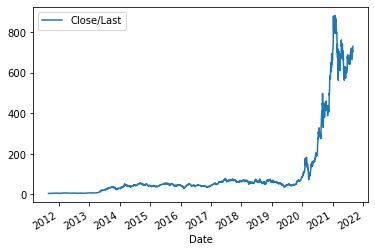

In [253]:

#get rid of all $ signs
colz=['Close/Last', 'Open', 'High', 'Low']
for i in colz:
    tesla_stock_df[i]= tesla_stock_df[i].str.replace('[^\d\.]', '').astype(float)

# #lets look at close prices for tesla in its history to narrow down a window where the stock looks most volatile
# #choose a window of monthly
tesla_close= tesla_stock_df.drop(["Volume","Open", "High", "Low"], 1)
tesla_close.set_index('Date', inplace= True)

tesla_close.plot()

In [254]:
# creating a new columns that indicates if the stock closed up or down
tesla_stock_df['Day_Net']= tesla_stock_df['Open']-tesla_stock_df['Close/Last']

In [282]:
df_senti_final.reset_index(inplace=True)

In [285]:
type(df_senti_final.date)

pandas.core.series.Series

In [286]:
type(tesla_stock_df.Date)

pandas.core.series.Series

In [293]:
# df_TSLA_Senti= df_senti_final.merge(tesla_stock_df, how="inner", left_on= "date", right_on= "Date")

df_TSLA_Senti= pd.concat([df_senti_final,tesla_stock_df],axis=1,ignore_index=False, join='inner')

In [294]:
df_TSLA_Senti

,date,Vader_neg,Vader_neu,Vader_pos,Vader_compound,article_count,TextBlob_article_polarity,TextBlob_article_subjectivity,TextBlob_snippet_polarity,TextBlob_snippet_subjectivity,TextBlob_lead_polarity,TextBlob_lead_subjectivity,Date,Close/Last,Volume,Open,High,Low,Day_Net
0,2010-01-02,0.07500,0.8130,0.1120,0.997600,1,0.104904,0.456615,0.166667,0.541667,0.000000,0.000000,2021-08-30,730.910,18604220,714.715,731.000,712.7300,-16.195
1,2010-01-05,0.03900,0.8880,0.0730,0.929400,1,0.062884,0.435767,0.000000,0.066667,0.000000,0.000000,2021-08-27,711.920,13833760,705.000,715.000,702.1001,-6.920
2,2010-01-07,0.04900,0.8870,0.0640,0.864100,1,0.056428,0.361864,-0.062500,0.312500,0.333333,0.333333,2021-08-26,701.160,13214290,708.310,715.400,697.6201,7.150
3,2010-01-11,0.03100,0.9000,0.0690,0.968200,1,0.074799,0.405435,0.000000,0.000000,0.072727,0.354924,2021-08-25,711.200,12645560,707.030,716.970,704.0000,-4.170
4,2010-01-12,0.02225,0.8925,0.0855,0.979775,4,0.101379,0.407863,-0.050000,0.275000,-0.034987,0.165146,2021-08-24,708.490,13083070,710.680,715.220,702.6400,2.190
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1758,2020-12-26,0.05300,0.8170,0.1300,0.999300,1,0.101275,0.419485,0.125000,0.500000,0.000000,0.000000,2014-09-05,55.478,55819100,56.510,56.580,54.5020,1.032
1759,2020-12-28,0.03950,0.8800,0.0800,0.993400,2,0.123472,0.443299,0.000000,0.000000,0.468561,0.784091,2014-09-04,57.208,41330865,56.802,58.284,56.0800,-0.406
1760,2020-12-29,0.04700,0.9190,0.0340,-0.780400,1,0.142424,0.513842,0.500000,0.500000,0.208081,0.363973,2014-09-03,56.238,33832100,57.534,57.600,56.0200,1.296
1761,2020-12-30,0.07350,0.8375,0.0895,0.165700,2,0.076615,0.428176,0.135417,0.454375,0.130000,0.320000,2014-09-02,56.824,48911695,55.100,56.978,54.8600,-1.724


In [297]:
#create a classification col returns 1 if stock is up and 0 is stock is down
df_TSLA_Senti['Green']= np.where(df_TSLA_Senti['Day_Net']>0,1,0)

In [298]:
df_TSLA_Senti

,date,Vader_neg,Vader_neu,Vader_pos,Vader_compound,article_count,TextBlob_article_polarity,TextBlob_article_subjectivity,TextBlob_snippet_polarity,TextBlob_snippet_subjectivity,TextBlob_lead_polarity,TextBlob_lead_subjectivity,Date,Close/Last,Volume,Open,High,Low,Day_Net,Green
0,2010-01-02,0.07500,0.8130,0.1120,0.997600,1,0.104904,0.456615,0.166667,0.541667,0.000000,0.000000,2021-08-30,730.910,18604220,714.715,731.000,712.7300,-16.195,0
1,2010-01-05,0.03900,0.8880,0.0730,0.929400,1,0.062884,0.435767,0.000000,0.066667,0.000000,0.000000,2021-08-27,711.920,13833760,705.000,715.000,702.1001,-6.920,0
2,2010-01-07,0.04900,0.8870,0.0640,0.864100,1,0.056428,0.361864,-0.062500,0.312500,0.333333,0.333333,2021-08-26,701.160,13214290,708.310,715.400,697.6201,7.150,1
3,2010-01-11,0.03100,0.9000,0.0690,0.968200,1,0.074799,0.405435,0.000000,0.000000,0.072727,0.354924,2021-08-25,711.200,12645560,707.030,716.970,704.0000,-4.170,0
4,2010-01-12,0.02225,0.8925,0.0855,0.979775,4,0.101379,0.407863,-0.050000,0.275000,-0.034987,0.165146,2021-08-24,708.490,13083070,710.680,715.220,702.6400,2.190,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1758,2020-12-26,0.05300,0.8170,0.1300,0.999300,1,0.101275,0.419485,0.125000,0.500000,0.000000,0.000000,2014-09-05,55.478,55819100,56.510,56.580,54.5020,1.032,1
1759,2020-12-28,0.03950,0.8800,0.0800,0.993400,2,0.123472,0.443299,0.000000,0.000000,0.468561,0.784091,2014-09-04,57.208,41330865,56.802,58.284,56.0800,-0.406,0
1760,2020-12-29,0.04700,0.9190,0.0340,-0.780400,1,0.142424,0.513842,0.500000,0.500000,0.208081,0.363973,2014-09-03,56.238,33832100,57.534,57.600,56.0200,1.296,1
1761,2020-12-30,0.07350,0.8375,0.0895,0.165700,2,0.076615,0.428176,0.135417,0.454375,0.130000,0.320000,2014-09-02,56.824,48911695,55.100,56.978,54.8600,-1.724,0


In [299]:
df_TSLA_Senti.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1763 entries, 0 to 1762
Data columns (total 20 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   date                           1763 non-null   object        
 1   Vader_neg                      1763 non-null   float64       
 2   Vader_neu                      1763 non-null   float64       
 3   Vader_pos                      1763 non-null   float64       
 4   Vader_compound                 1763 non-null   float64       
 5   article_count                  1763 non-null   int64         
 6   TextBlob_article_polarity      1763 non-null   float64       
 7   TextBlob_article_subjectivity  1763 non-null   float64       
 8   TextBlob_snippet_polarity      1763 non-null   float64       
 9   TextBlob_snippet_subjectivity  1763 non-null   float64       
 10  TextBlob_lead_polarity         1763 non-null   float64       
 11  TextBlob_lead_sub

In [300]:
df_TSLA_Senti.to_csv('tesla_baseline_sentiment_data')

In [302]:
d=pd.read_csv('tesla_baseline_sentiment_data')

,Unnamed: 0,date,Vader_neg,Vader_neu,Vader_pos,Vader_compound,article_count,TextBlob_article_polarity,TextBlob_article_subjectivity,TextBlob_snippet_polarity,...,TextBlob_lead_polarity,TextBlob_lead_subjectivity,Date,Close/Last,Volume,Open,High,Low,Day_Net,Green
0,0,2010-01-02,0.07500,0.8130,0.1120,0.997600,1,0.104904,0.456615,0.166667,...,0.000000,0.000000,2021-08-30,730.910,18604220,714.715,731.000,712.7300,-16.195,0
1,1,2010-01-05,0.03900,0.8880,0.0730,0.929400,1,0.062884,0.435767,0.000000,...,0.000000,0.000000,2021-08-27,711.920,13833760,705.000,715.000,702.1001,-6.920,0
2,2,2010-01-07,0.04900,0.8870,0.0640,0.864100,1,0.056428,0.361864,-0.062500,...,0.333333,0.333333,2021-08-26,701.160,13214290,708.310,715.400,697.6201,7.150,1
3,3,2010-01-11,0.03100,0.9000,0.0690,0.968200,1,0.074799,0.405435,0.000000,...,0.072727,0.354924,2021-08-25,711.200,12645560,707.030,716.970,704.0000,-4.170,0
4,4,2010-01-12,0.02225,0.8925,0.0855,0.979775,4,0.101379,0.407863,-0.050000,...,-0.034987,0.165146,2021-08-24,708.490,13083070,710.680,715.220,702.6400,2.190,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1758,1758,2020-12-26,0.05300,0.8170,0.1300,0.999300,1,0.101275,0.419485,0.125000,...,0.000000,0.000000,2014-09-05,55.478,55819100,56.510,56.580,54.5020,1.032,1
1759,1759,2020-12-28,0.03950,0.8800,0.0800,0.993400,2,0.123472,0.443299,0.000000,...,0.468561,0.784091,2014-09-04,57.208,41330865,56.802,58.284,56.0800,-0.406,0
1760,1760,2020-12-29,0.04700,0.9190,0.0340,-0.780400,1,0.142424,0.513842,0.500000,...,0.208081,0.363973,2014-09-03,56.238,33832100,57.534,57.600,56.0200,1.296,1
1761,1761,2020-12-30,0.07350,0.8375,0.0895,0.165700,2,0.076615,0.428176,0.135417,...,0.130000,0.320000,2014-09-02,56.824,48911695,55.100,56.978,54.8600,-1.724,0


In [306]:
for i in df_TSLA_Senti:
    print(i)

date
Vader_neg
Vader_neu
Vader_pos
Vader_compound
article_count
TextBlob_article_polarity
TextBlob_article_subjectivity
TextBlob_snippet_polarity
TextBlob_snippet_subjectivity
TextBlob_lead_polarity
TextBlob_lead_subjectivity
Date
Close/Last
Volume
Open
High
Low
Day_Net
Green


In [307]:
df_TSLA_Senti.drop(['Date'], axis=1, inplace=True)

In [320]:
df_TSLA_Senti.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1763 entries, 0 to 1762
Data columns (total 19 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   date                           1763 non-null   object 
 1   Vader_neg                      1763 non-null   float64
 2   Vader_neu                      1763 non-null   float64
 3   Vader_pos                      1763 non-null   float64
 4   Vader_compound                 1763 non-null   float64
 5   article_count                  1763 non-null   int64  
 6   TextBlob_article_polarity      1763 non-null   float64
 7   TextBlob_article_subjectivity  1763 non-null   float64
 8   TextBlob_snippet_polarity      1763 non-null   float64
 9   TextBlob_snippet_subjectivity  1763 non-null   float64
 10  TextBlob_lead_polarity         1763 non-null   float64
 11  TextBlob_lead_subjectivity     1763 non-null   float64
 12  Close/Last                     1763 non-null   f

## Dummy Model/ Baseline Model

In [324]:
from sklearn.dummy import DummyClassifier
X= df_TSLA_Senti.drop(['Green','date'],1)
y= df_TSLA_Senti['Green']
dummy_clf = DummyClassifier(strategy="most_frequent")

dummy_clf.fit(X,y)
dummy_clf.predict(X)

dummy_clf.score(X,y)



0.500850822461713

In [325]:
#Baseline came out around 50%

## First Logistic Model

In [339]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report
#split the train and test sets 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state=42)

#create a pipeline
pipe=Pipeline([('sd', StandardScaler()),('log_clf', LogisticRegression(random_state=4))])





In [340]:
pipe.fit(X_train, y_train)
log_preds=pipe.predict(X_test)

print(classification_report(y_test,log_preds))

              precision    recall  f1-score   support

           0       0.96      0.96      0.96       263
           1       0.96      0.96      0.96       266

    accuracy                           0.96       529
   macro avg       0.96      0.96      0.96       529
weighted avg       0.96      0.96      0.96       529



In [ ]:
#wow what a great baseline


## Engineer some More Features such as RSI and Bollinger bands

In [382]:
#RSI
window_length = 14
close= tes['Close/Last']
delta= close.diff()
delta = delta[1:] 

# Now lets Explore Tesla Data and see if we can engineer even more features

<AxesSubplot:>

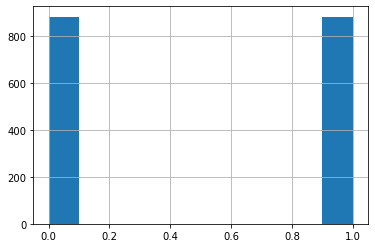

In [333]:
#lets first see if there is a class inbalance:

df_TSLA_Senti['Green'].hist()

In [336]:
#we have a very nicely balanced data set
df_TSLA_Senti['Green'].value_counts()

1    883
0    880
Name: Green, dtype: int64

In [344]:
tesla_stock_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2516 entries, 0 to 2515
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Date        2516 non-null   datetime64[ns]
 1   Close/Last  2516 non-null   float64       
 2   Volume      2516 non-null   int64         
 3   Open        2516 non-null   float64       
 4   High        2516 non-null   float64       
 5   Low         2516 non-null   float64       
 6   Day_Net     2516 non-null   float64       
dtypes: datetime64[ns](1), float64(5), int64(1)
memory usage: 137.7 KB


In [346]:
tes=tesla_stock_df.drop(['Volume','Open','High','Low','Day_Net'],1)

In [352]:
tes.set_index('Date', inplace=True)

<Figure size 432x288 with 0 Axes>

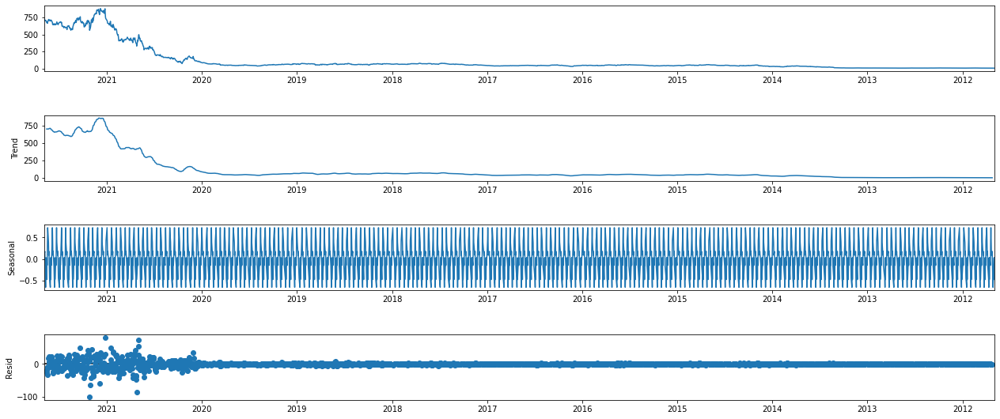

In [378]:
from statsmodels.tsa.seasonal import seasonal_decompose
decomposition = seasonal_decompose(tes, period=12)
fig = plt.figure()
fig = decomposition.plot()
fig.set_size_inches(20, 8)

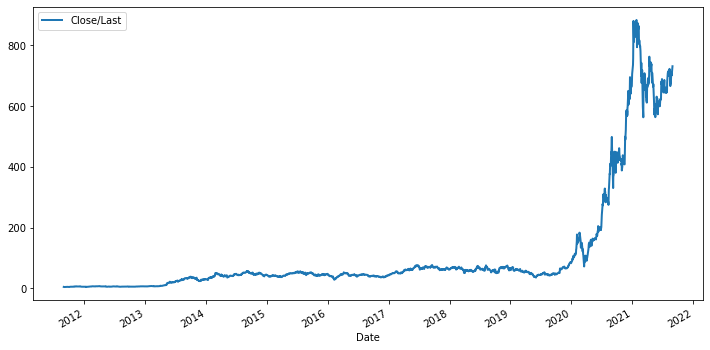

In [379]:
tes.plot(figsize=(12,6), linewidth=2, fontsize=10);

Overall upwards trend especially towards the end of the Years

In [380]:
from statsmodels.tsa.stattools import adfuller
dftest = adfuller(tes['Close/Last'])
dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used'])
for key,value in dftest[4].items():
    dfoutput['Critical Value (%s)'%key] = value
print(dfoutput)

Test Statistic                   -3.225468
p-value                           0.018557
#Lags Used                       27.000000
Number of Observations Used    2488.000000
Critical Value (1%)              -3.432981
Critical Value (5%)              -2.862702
Critical Value (10%)             -2.567389
dtype: float64


From the test It seems that the stock is stationary, but that could be due to the stock being very stationary for most of its life since IPO